In [1]:
import cv2
import numpy
from torchvision import models

In [2]:
dir(models)

['AlexNet',
 'AlexNet_Weights',
 'ConvNeXt',
 'ConvNeXt_Base_Weights',
 'ConvNeXt_Large_Weights',
 'ConvNeXt_Small_Weights',
 'ConvNeXt_Tiny_Weights',
 'DenseNet',
 'DenseNet121_Weights',
 'DenseNet161_Weights',
 'DenseNet169_Weights',
 'DenseNet201_Weights',
 'EfficientNet',
 'EfficientNet_B0_Weights',
 'EfficientNet_B1_Weights',
 'EfficientNet_B2_Weights',
 'EfficientNet_B3_Weights',
 'EfficientNet_B4_Weights',
 'EfficientNet_B5_Weights',
 'EfficientNet_B6_Weights',
 'EfficientNet_B7_Weights',
 'EfficientNet_V2_L_Weights',
 'EfficientNet_V2_M_Weights',
 'EfficientNet_V2_S_Weights',
 'GoogLeNet',
 'GoogLeNetOutputs',
 'GoogLeNet_Weights',
 'Inception3',
 'InceptionOutputs',
 'Inception_V3_Weights',
 'MNASNet',
 'MNASNet0_5_Weights',
 'MNASNet0_75_Weights',
 'MNASNet1_0_Weights',
 'MNASNet1_3_Weights',
 'MaxVit',
 'MaxVit_T_Weights',
 'MobileNetV2',
 'MobileNetV3',
 'MobileNet_V2_Weights',
 'MobileNet_V3_Large_Weights',
 'MobileNet_V3_Small_Weights',
 'RegNet',
 'RegNet_X_16GF_Weights'

In [3]:
resnet = models.resnet101(weights=True)

C:\Users\kgibo\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [4]:
resnet

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [5]:
from torchvision import transforms

preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

In [6]:
from PIL import Image

img = Image.open("Bobby.jpg")

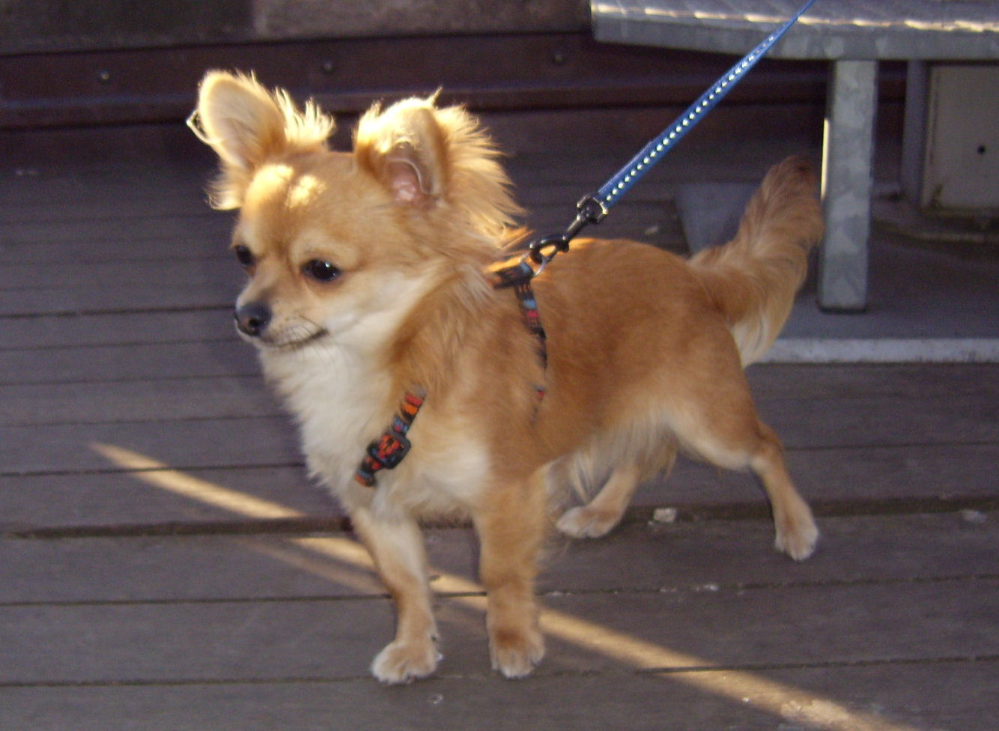

In [7]:
img

In [8]:
img_t = preprocess(img)

In [9]:
img_t

tensor([[[-1.5014, -1.4500, -1.4843,  ..., -0.5938, -0.5253, -0.5082],
         [-1.3987, -1.3815, -1.3815,  ..., -0.5767, -0.4739, -0.4397],
         [-1.2617, -1.2788, -1.2617,  ..., -0.5253, -0.4568, -0.4739],
         ...,
         [-0.5938, -0.6109, -0.5938,  ..., -0.6281, -0.6623, -0.7137],
         [-0.6965, -0.7479, -0.7650,  ..., -0.6794, -0.6965, -0.6965],
         [-0.7822, -0.7308, -0.6965,  ..., -0.7308, -0.7137, -0.6794]],

        [[-1.6506, -1.6856, -1.6506,  ..., -0.3725, -0.3200, -0.3200],
         [-1.5455, -1.5455, -1.5280,  ..., -0.3550, -0.2675, -0.2500],
         [-1.4405, -1.4230, -1.4230,  ..., -0.4076, -0.3025, -0.3025],
         ...,
         [-0.5651, -0.6001, -0.6001,  ..., -0.7227, -0.7227, -0.7577],
         [-0.7402, -0.7927, -0.8102,  ..., -0.7052, -0.7402, -0.7402],
         [-0.7577, -0.7752, -0.7227,  ..., -0.7577, -0.7577, -0.7402]],

        [[-1.3164, -1.2990, -1.2816,  ...,  0.0431,  0.1128,  0.1476],
         [-1.1596, -1.1596, -1.1421,  ...,  0

In [10]:
import torch

batch_t = torch.unsqueeze(img_t, 0)

In [11]:
batch_t

tensor([[[[-1.5014, -1.4500, -1.4843,  ..., -0.5938, -0.5253, -0.5082],
          [-1.3987, -1.3815, -1.3815,  ..., -0.5767, -0.4739, -0.4397],
          [-1.2617, -1.2788, -1.2617,  ..., -0.5253, -0.4568, -0.4739],
          ...,
          [-0.5938, -0.6109, -0.5938,  ..., -0.6281, -0.6623, -0.7137],
          [-0.6965, -0.7479, -0.7650,  ..., -0.6794, -0.6965, -0.6965],
          [-0.7822, -0.7308, -0.6965,  ..., -0.7308, -0.7137, -0.6794]],

         [[-1.6506, -1.6856, -1.6506,  ..., -0.3725, -0.3200, -0.3200],
          [-1.5455, -1.5455, -1.5280,  ..., -0.3550, -0.2675, -0.2500],
          [-1.4405, -1.4230, -1.4230,  ..., -0.4076, -0.3025, -0.3025],
          ...,
          [-0.5651, -0.6001, -0.6001,  ..., -0.7227, -0.7227, -0.7577],
          [-0.7402, -0.7927, -0.8102,  ..., -0.7052, -0.7402, -0.7402],
          [-0.7577, -0.7752, -0.7227,  ..., -0.7577, -0.7577, -0.7402]],

         [[-1.3164, -1.2990, -1.2816,  ...,  0.0431,  0.1128,  0.1476],
          [-1.1596, -1.1596, -

In [12]:
resnet.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [13]:
out = resnet(batch_t)
out

tensor([[-1.2040e+00,  2.3782e-01, -2.2614e+00, -3.3553e+00, -1.1527e+00,
          4.9851e-01, -3.1179e+00,  6.6991e-01,  2.2846e+00, -1.4087e+00,
         -2.6820e-01,  4.2388e-01, -2.7201e+00, -2.4811e+00, -2.7656e+00,
         -2.2070e+00,  3.4329e-01,  1.4271e+00, -1.0663e+00, -1.2803e+00,
         -2.8761e+00, -2.3529e+00, -2.6160e+00, -5.9357e-01, -3.0525e+00,
          1.3324e-01, -1.1354e+00, -9.1114e-01, -7.7302e-01,  6.9272e-01,
         -1.9403e+00, -9.4796e-01,  7.9682e-01, -1.7379e+00, -1.5647e+00,
         -2.7074e+00, -1.3362e+00, -1.0261e+00,  4.9343e-01, -2.4979e+00,
         -1.8928e-01, -1.1957e-01,  1.8450e-01, -1.1908e+00,  7.4295e-01,
         -2.7621e-01, -7.5280e-01, -7.2764e-02, -3.3827e+00, -2.5758e+00,
         -2.7130e+00,  5.4549e-01, -2.0622e+00, -3.2242e+00, -1.4151e+00,
         -1.3232e+00, -1.0131e+00, -1.5668e+00, -1.1950e+00, -1.8733e+00,
          8.3243e-01, -2.9325e+00, -7.1774e-01, -9.2799e-01, -2.5626e+00,
         -1.4621e+00, -1.2560e+00, -6.

In [14]:
with open('imagenet_classes.txt') as f:
    labels = [line.strip() for line in f.readlines()]

In [15]:
_, index = torch.max(out, 1)

In [16]:
index

tensor([151])

In [17]:
percentage = torch.nn.functional.softmax(out, dim=1)[0] * 100
labels[index[0]], percentage[index[0]].item()

('151, Chihuahua', 61.945430755615234)

In [18]:
_, indices = torch.sort(out, descending=True)
[(labels[idx], percentage[idx].item()) for idx in indices[0][:5]]

[('151, Chihuahua', 61.945430755615234),
 ('259, Pomeranian', 32.61177062988281),
 ('154, Pekinese', 1.530737280845642),
 ('157, papillon', 1.045319676399231),
 ('263, Pembroke', 0.5696007013320923)]

In [19]:
import torch
import torch.nn as nn


class ResNetBlock(nn.Module):  # <1>

    def __init__(self, dim):
        super(ResNetBlock, self).__init__()
        self.conv_block = self.build_conv_block(dim)

    def build_conv_block(self, dim):
        conv_block = []

        conv_block += [nn.ReflectionPad2d(1)]

        conv_block += [nn.Conv2d(dim, dim, kernel_size=3, padding=0, bias=True),
                       nn.InstanceNorm2d(dim),
                       nn.ReLU(True)]

        conv_block += [nn.ReflectionPad2d(1)]

        conv_block += [nn.Conv2d(dim, dim, kernel_size=3, padding=0, bias=True),
                       nn.InstanceNorm2d(dim)]

        return nn.Sequential(*conv_block)

    def forward(self, x):
        out = x + self.conv_block(x)  # <2>
        return out


class ResNetGenerator(nn.Module):

    def __init__(self, input_nc=3, output_nc=3, ngf=64, n_blocks=9):  # <3> 

        assert (n_blocks >= 0)
        super(ResNetGenerator, self).__init__()

        self.input_nc = input_nc
        self.output_nc = output_nc
        self.ngf = ngf

        model = [nn.ReflectionPad2d(3),
                 nn.Conv2d(input_nc, ngf, kernel_size=7, padding=0, bias=True),
                 nn.InstanceNorm2d(ngf),
                 nn.ReLU(True)]

        n_downsampling = 2
        for i in range(n_downsampling):
            mult = 2 ** i
            model += [nn.Conv2d(ngf * mult, ngf * mult * 2, kernel_size=3,
                                stride=2, padding=1, bias=True),
                      nn.InstanceNorm2d(ngf * mult * 2),
                      nn.ReLU(True)]

        mult = 2 ** n_downsampling
        for i in range(n_blocks):
            model += [ResNetBlock(ngf * mult)]

        for i in range(n_downsampling):
            mult = 2 ** (n_downsampling - i)
            model += [nn.ConvTranspose2d(ngf * mult, int(ngf * mult / 2),
                                         kernel_size=3, stride=2,
                                         padding=1, output_padding=1,
                                         bias=True),
                      nn.InstanceNorm2d(int(ngf * mult / 2)),
                      nn.ReLU(True)]

        model += [nn.ReflectionPad2d(3)]
        model += [nn.Conv2d(ngf, output_nc, kernel_size=7, padding=0)]
        model += [nn.Tanh()]

        self.model = nn.Sequential(*model)

    def forward(self, input):  # <3>
        return self.model(input)

In [20]:
netG = ResNetGenerator()

In [21]:
model_path = 'horse2zebra_0.4.0.pth'
model_data = torch.load(model_path)
netG.load_state_dict(model_data)

<All keys matched successfully>

In [22]:
netG.eval()

ResNetGenerator(
  (model): Sequential(
    (0): ReflectionPad2d((3, 3, 3, 3))
    (1): Conv2d(3, 64, kernel_size=(7, 7), stride=(1, 1))
    (2): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (3): ReLU(inplace=True)
    (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (5): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (8): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (9): ReLU(inplace=True)
    (10): ResNetBlock(
      (conv_block): Sequential(
        (0): ReflectionPad2d((1, 1, 1, 1))
        (1): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1))
        (2): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
        (3): ReLU(inplace=True)
        (4): ReflectionPad2d((1, 1, 1, 1))
     

In [23]:
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.ToTensor()
])

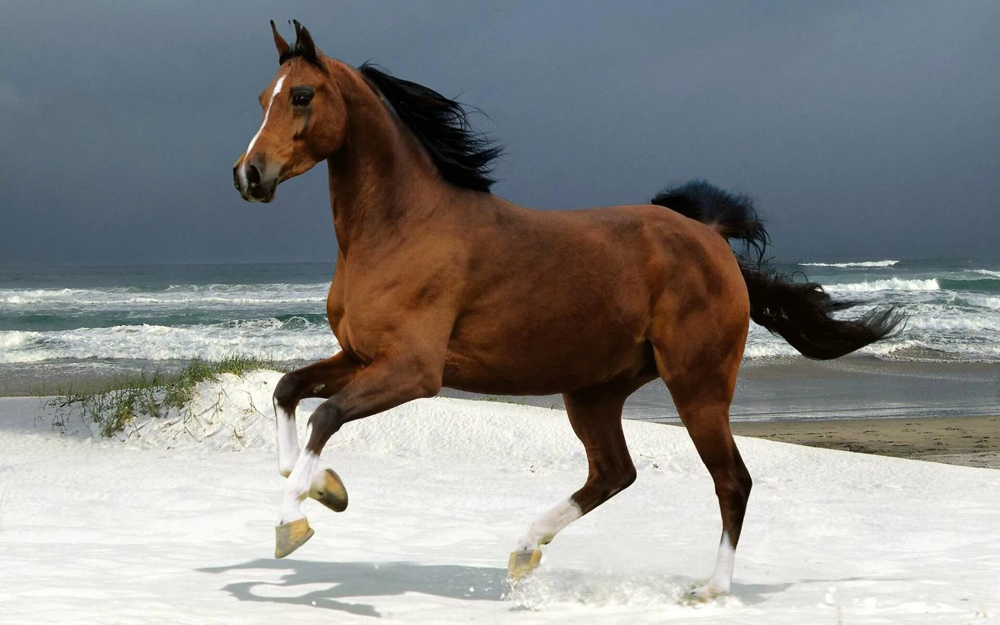

In [24]:
img = Image.open('horse.jpg')
img

In [25]:
img_t = preprocess(img)
batch_t = torch.unsqueeze(img_t, 0)

In [26]:
batch_out = netG(batch_t)

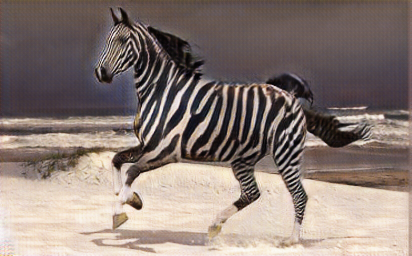

In [27]:
out_t = (batch_out.data.squeeze() + 1.0) / 2.0
out_img = transforms.ToPILImage()(out_t)
out_img

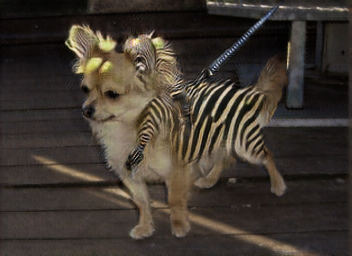

In [28]:
horse_img = Image.open('Bobby.jpg')
horse_img_t = preprocess(horse_img)
horse_batch_t = torch.unsqueeze(horse_img_t, 0)
horse_batch_out = netG(horse_batch_t)
horse_out_t = (horse_batch_out.data.squeeze() + 1.0) / 2.0
horse_out_img = transforms.ToPILImage()(horse_out_t)
horse_out_img

In [29]:
a = torch.ones(3)
a

tensor([1., 1., 1.])

In [30]:
a[1]

tensor(1.)

In [31]:
float(a[1])

1.0

In [32]:
a[2] = 2.0
a

tensor([1., 1., 2.])

In [33]:
points = torch.tensor([4.0, 1.0, 5.0, 3.0, 2.0, 1.0])
points

tensor([4., 1., 5., 3., 2., 1.])

In [34]:
float(points[0]), float(points[1])

(4.0, 1.0)

In [35]:
points = torch.tensor([[4.0, 1.0], [5.0, 3.0], [2.0, 1.0]])
points

tensor([[4., 1.],
        [5., 3.],
        [2., 1.]])

In [36]:
points.shape

torch.Size([3, 2])

In [37]:
points = torch.zeros(3, 2)
points

tensor([[0., 0.],
        [0., 0.],
        [0., 0.]])

In [38]:
points = torch.tensor([[4.0, 1.0], [5.0, 3.0], [2.0, 1.0]])
points

tensor([[4., 1.],
        [5., 3.],
        [2., 1.]])

In [39]:
points[0, 1]

tensor(1.)

In [40]:
points[1, 1]

tensor(3.)

In [41]:
points[0]

tensor([4., 1.])

In [42]:
points[:0]

tensor([], size=(0, 2))

In [43]:
some_list = list(range(6))

In [44]:
some_list[1:4:2]

[1, 3]

In [45]:
img_t = torch.randn(3, 5, 5)
weights = torch.tensor([0.2126, 0.7152, 0.0722])

In [46]:
batch_t = torch.randn(2, 3, 5, 5)

In [47]:
img_gray_naive = img_t.mean(-3)
batch_gray_naive = batch_t.mean(-3)
img_gray_naive.shape, batch_gray_naive.shape

(torch.Size([5, 5]), torch.Size([2, 5, 5]))

In [48]:
unsqueezed_weights = weights.unsqueeze(-1).unsqueeze(-1)
img_weights = (img_t * unsqueezed_weights)
batch_weights = (batch_t * unsqueezed_weights)

In [49]:
img_gray_weighted = img_weights.sum(-3)
batch_gray_weighted = batch_weights.sum(-3)
batch_weights.shape, batch_t.shape, unsqueezed_weights.shape

(torch.Size([2, 3, 5, 5]), torch.Size([2, 3, 5, 5]), torch.Size([3, 1, 1]))

In [50]:
img_gray_weighted_fancy = torch.einsum('...chw,c->...hw', img_t, weights)
batch_gray_weighted_fancy = torch.einsum('...chw,c->...hw', batch_t, weights)
batch_gray_weighted_fancy.shape

torch.Size([2, 5, 5])

In [51]:
a = torch.tensor([1.0, 2.0, 3.0], dtype=torch.int8)

In [52]:
a

tensor([1, 2, 3], dtype=torch.int8)

In [53]:
a.dtype

torch.int8

In [54]:
a = torch.ones(3, 2)
a_t = torch.transpose(a, 0, 1)
a.shape, a_t.shape

(torch.Size([3, 2]), torch.Size([2, 3]))

In [55]:
a.transpose(0, 1).shape

torch.Size([2, 3])

In [56]:
a.storage()

C:\Users\kgibo\AppData\Local\Temp\ipykernel_29432\2905276573.py:1: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  a.storage()


 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
[torch.storage.TypedStorage(dtype=torch.float32, device=cpu) of size 6]

In [57]:
a.untyped_storage()

 0
 0
 128
 63
 0
 0
 128
 63
 0
 0
 128
 63
 0
 0
 128
 63
 0
 0
 128
 63
 0
 0
 128
 63
[torch.storage.UntypedStorage(device=cpu) of size 24]

In [58]:
points = torch.tensor([[4.0, 1.0], [5.0, 3.0], [2.0, 1.0]])
points.storage()

 4.0
 1.0
 5.0
 3.0
 2.0
 1.0
[torch.storage.TypedStorage(dtype=torch.float32, device=cpu) of size 6]

In [59]:
points.untyped_storage()[0]

0

In [60]:
points.zero_()
points

tensor([[0., 0.],
        [0., 0.],
        [0., 0.]])

In [61]:
points = torch.tensor([[4.0, 1.0], [5.0, 3.0], [2.0, 1.0]])
points

tensor([[4., 1.],
        [5., 3.],
        [2., 1.]])

In [62]:
points_t = points.t()
points_t

tensor([[4., 5., 2.],
        [1., 3., 1.]])

In [63]:
id(points.storage()) == id(points_t.storage())

True

In [64]:
points.stride(), points_t.stride()

((2, 1), (1, 2))

In [65]:
points.is_contiguous()

True

In [66]:
points_t.is_contiguous()

False

In [67]:
points

tensor([[4., 1.],
        [5., 3.],
        [2., 1.]])

In [68]:
points.contiguous()

tensor([[4., 1.],
        [5., 3.],
        [2., 1.]])

In [69]:
points

tensor([[4., 1.],
        [5., 3.],
        [2., 1.]])

In [70]:
torch.save(points, 'points.t')

In [71]:
points = torch.load('points.t')
points

tensor([[4., 1.],
        [5., 3.],
        [2., 1.]])

In [72]:
import h5py

f = h5py.File('points.hdf5', 'w')

In [73]:
dset = f.create_dataset('coords', data=points.numpy())
f.close()

In [74]:
f = h5py.File('points.hdf5', 'r')
dset = f['coords']
last_points = dset[-2:]

In [75]:
last_points = torch.from_numpy(dset[-2:])
f.close()

In [76]:
last_points

tensor([[5., 3.],
        [2., 1.]])

In [77]:
dset

<Closed HDF5 dataset>

In [78]:
with h5py.File('points.hdf5', 'r') as f:
    dset = f['coords']
    last_points = torch.from_numpy(dset[-2:])
    print(last_points)

tensor([[5., 3.],
        [2., 1.]])


In [79]:
a_t = torch.tensor(list(range(9)))
a_t

tensor([0, 1, 2, 3, 4, 5, 6, 7, 8])

In [80]:
a_t.size()

torch.Size([9])

In [81]:
a_t.storage_offset(), a_t.stride()

(0, (1,))

In [82]:
b_t = a_t.view(3, 3)

In [83]:
a_t.storage()

 0
 1
 2
 3
 4
 5
 6
 7
 8
[torch.storage.TypedStorage(dtype=torch.int64, device=cpu) of size 9]

In [84]:
a_t.shape, b_t.shape

(torch.Size([9]), torch.Size([3, 3]))

In [85]:
a_t, b_t

(tensor([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 tensor([[0, 1, 2],
         [3, 4, 5],
         [6, 7, 8]]))

In [86]:
c_t = torch.ones(16).view(4, 4)
c_t

tensor([[1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.]])

In [87]:
c_t = b_t[1:, 1:]

In [88]:
c_t

tensor([[4, 5],
        [7, 8]])

In [89]:
b_t

tensor([[0, 1, 2],
        [3, 4, 5],
        [6, 7, 8]])

In [90]:
torch.nn.functional.tanh(a_t.view(3, 3))

tensor([[0.0000, 0.7616, 0.9640],
        [0.9951, 0.9993, 0.9999],
        [1.0000, 1.0000, 1.0000]])

In [91]:
import imageio.v2 as imageio

img_arr = imageio.imread('Bobby.jpg')
img_arr.shape

(976, 1334, 3)

In [92]:
img = torch.from_numpy(img_arr)
out = img.permute(2, 0, 1)

In [93]:
out.shape

torch.Size([3, 976, 1334])

In [94]:
import os

os.listdir('dlwpt-code/data/p1ch4/image-cats/')

['cat1.png', 'cat2.png', 'cat3.png']

In [95]:
batch_size = 3
batch = torch.zeros(batch_size, 3, 256, 256, dtype=torch.uint8)

In [96]:
data_dir = 'dlwpt-code/data/p1ch4/image-cats/'
filenames = [name for name in os.listdir(data_dir) if os.path.splitext(name)[-1] == '.png']
filenames

['cat1.png', 'cat2.png', 'cat3.png']

In [97]:
for i, fname in enumerate(filenames):
    img_arr = imageio.imread(os.path.join(data_dir, fname))
    img_t = torch.from_numpy(img_arr)
    img_t = img_t.permute(2, 0, 1)
    img_t = img_t[:3]  # сохраняем только 3 канала (бывает альфа канал который излишен)
    batch[i] = img_t

In [98]:
batch.shape

torch.Size([3, 3, 256, 256])

In [99]:
batch = batch.float()
batch /= 255.0
batch

tensor([[[[0.6118, 0.5961, 0.4863,  ..., 0.5882, 0.5843, 0.6196],
          [0.6824, 0.5255, 0.6471,  ..., 0.4706, 0.5333, 0.5412],
          [0.4980, 0.6118, 0.4196,  ..., 0.5137, 0.5608, 0.6431],
          ...,
          [0.4549, 0.5098, 0.5059,  ..., 0.4980, 0.4627, 0.4392],
          [0.5059, 0.5098, 0.4824,  ..., 0.4510, 0.4745, 0.4471],
          [0.5059, 0.4824, 0.4627,  ..., 0.4431, 0.4745, 0.4706]],

         [[0.5451, 0.5294, 0.4275,  ..., 0.5294, 0.5294, 0.5765],
          [0.6275, 0.4667, 0.5843,  ..., 0.4118, 0.4784, 0.4863],
          [0.4431, 0.5490, 0.3529,  ..., 0.4627, 0.5059, 0.5961],
          ...,
          [0.3882, 0.4314, 0.4353,  ..., 0.4588, 0.4235, 0.4039],
          [0.4353, 0.4353, 0.4157,  ..., 0.4157, 0.4392, 0.4118],
          [0.4353, 0.4078, 0.4000,  ..., 0.4039, 0.4314, 0.4353]],

         [[0.5059, 0.4824, 0.3843,  ..., 0.5137, 0.5176, 0.5686],
          [0.6078, 0.4314, 0.5373,  ..., 0.4000, 0.4667, 0.4745],
          [0.4078, 0.5176, 0.3137,  ..., 0

In [100]:
n_channels = batch.shape[1]
for c in range(n_channels):
    mean = torch.mean(batch[:, c])
    std = torch.std(batch[:, c])
    batch[:, c] = (batch[:, c] - mean) / std

In [101]:
batch

tensor([[[[ 0.1439,  0.0730, -0.4234,  ...,  0.0375,  0.0198,  0.1794],
          [ 0.4631, -0.2461,  0.3035,  ..., -0.4944, -0.2107, -0.1752],
          [-0.3703,  0.1439, -0.7249,  ..., -0.2993, -0.0866,  0.2858],
          ...,
          [-0.5653, -0.3171, -0.3348,  ..., -0.3703, -0.5298, -0.6362],
          [-0.3348, -0.3171, -0.4412,  ..., -0.5830, -0.4766, -0.6007],
          [-0.3348, -0.4412, -0.5298,  ..., -0.6185, -0.4766, -0.4944]],

         [[ 0.4632,  0.3874, -0.1058,  ...,  0.3874,  0.3874,  0.6150],
          [ 0.8615,  0.0839,  0.6529,  ..., -0.1816,  0.1408,  0.1787],
          [-0.0299,  0.4822, -0.4661,  ...,  0.0649,  0.2736,  0.7098],
          ...,
          [-0.2954, -0.0868, -0.0678,  ...,  0.0460, -0.1247, -0.2196],
          [-0.0678, -0.0678, -0.1627,  ..., -0.1627, -0.0489, -0.1816],
          [-0.0678, -0.2006, -0.2385,  ..., -0.2196, -0.0868, -0.0678]],

         [[ 0.7792,  0.6573,  0.1495,  ...,  0.8198,  0.8401,  1.1041],
          [ 1.3072,  0.3933,  

In [102]:
dir_path = "dlwpt-code/data/p1ch4/volumetric-dicom/2-LUNG 3.0  B70f-04083"
vol_arr = imageio.volread(dir_path, "DICOM")
vol_arr.shape

Reading DICOM (examining files): 99/99 files (100.0%)
  Found 1 correct series.
Reading DICOM (loading data): 99/99  (100.0%)


(99, 512, 512)

In [103]:
vol = torch.from_numpy(vol_arr).float()
vol = torch.unsqueeze(vol, 0)
vol.shape

torch.Size([1, 99, 512, 512])

In [104]:
import csv
import numpy as np

wine_path = 'dlwpt-code/data/p1ch4/tabular-wine/winequality-white.csv'
wineq_numpy = np.loadtxt(wine_path, dtype=np.float32, delimiter=";", skiprows=1)
wineq_numpy

array([[ 7.  ,  0.27,  0.36, ...,  0.45,  8.8 ,  6.  ],
       [ 6.3 ,  0.3 ,  0.34, ...,  0.49,  9.5 ,  6.  ],
       [ 8.1 ,  0.28,  0.4 , ...,  0.44, 10.1 ,  6.  ],
       ...,
       [ 6.5 ,  0.24,  0.19, ...,  0.46,  9.4 ,  6.  ],
       [ 5.5 ,  0.29,  0.3 , ...,  0.38, 12.8 ,  7.  ],
       [ 6.  ,  0.21,  0.38, ...,  0.32, 11.8 ,  6.  ]], dtype=float32)

In [105]:
with open(wine_path, 'r') as f:
    col_list = next(csv.reader(f, delimiter=';'))

print(f'shape: {wineq_numpy.shape}\ncolumns: {col_list}')

shape: (4898, 12)
columns: ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol', 'quality']


In [106]:
wineq_t = torch.from_numpy(wineq_numpy)
wineq_t.shape, wineq_t.dtype

(torch.Size([4898, 12]), torch.float32)

In [107]:
wineq_t

tensor([[ 7.0000,  0.2700,  0.3600,  ...,  0.4500,  8.8000,  6.0000],
        [ 6.3000,  0.3000,  0.3400,  ...,  0.4900,  9.5000,  6.0000],
        [ 8.1000,  0.2800,  0.4000,  ...,  0.4400, 10.1000,  6.0000],
        ...,
        [ 6.5000,  0.2400,  0.1900,  ...,  0.4600,  9.4000,  6.0000],
        [ 5.5000,  0.2900,  0.3000,  ...,  0.3800, 12.8000,  7.0000],
        [ 6.0000,  0.2100,  0.3800,  ...,  0.3200, 11.8000,  6.0000]])

In [108]:
data_t = wineq_t[:, :-1]
data_t, data_t.shape

(tensor([[ 7.0000,  0.2700,  0.3600,  ...,  3.0000,  0.4500,  8.8000],
         [ 6.3000,  0.3000,  0.3400,  ...,  3.3000,  0.4900,  9.5000],
         [ 8.1000,  0.2800,  0.4000,  ...,  3.2600,  0.4400, 10.1000],
         ...,
         [ 6.5000,  0.2400,  0.1900,  ...,  2.9900,  0.4600,  9.4000],
         [ 5.5000,  0.2900,  0.3000,  ...,  3.3400,  0.3800, 12.8000],
         [ 6.0000,  0.2100,  0.3800,  ...,  3.2600,  0.3200, 11.8000]]),
 torch.Size([4898, 11]))

In [109]:
quality_t = wineq_t[:, -1]
quality_t, quality_t.shape

(tensor([6., 6., 6.,  ..., 6., 7., 6.]), torch.Size([4898]))

In [110]:
# train data and quality results
data_t, quality_t

(tensor([[ 7.0000,  0.2700,  0.3600,  ...,  3.0000,  0.4500,  8.8000],
         [ 6.3000,  0.3000,  0.3400,  ...,  3.3000,  0.4900,  9.5000],
         [ 8.1000,  0.2800,  0.4000,  ...,  3.2600,  0.4400, 10.1000],
         ...,
         [ 6.5000,  0.2400,  0.1900,  ...,  2.9900,  0.4600,  9.4000],
         [ 5.5000,  0.2900,  0.3000,  ...,  3.3400,  0.3800, 12.8000],
         [ 6.0000,  0.2100,  0.3800,  ...,  3.2600,  0.3200, 11.8000]]),
 tensor([6., 6., 6.,  ..., 6., 7., 6.]))

In [111]:
quality_as_marks_t = quality_t.long()

In [112]:
quality_t = quality_t.long()
quality_onehot_t = torch.zeros(quality_t.shape[0], 10)
quality_onehot_t.scatter_(1, quality_t.unsqueeze(1), 1.0)
quality_onehot_t

tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 1., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])

In [113]:
quality_unsqueezed_t = quality_t.unsqueeze(1)
quality_unsqueezed_t, quality_unsqueezed_t.shape

(tensor([[6],
         [6],
         [6],
         ...,
         [6],
         [7],
         [6]]),
 torch.Size([4898, 1]))

In [114]:
print(id(quality_t[0]) == id(quality_unsqueezed_t[0, 0]))
quality_t[0], quality_unsqueezed_t[0, 0]

True


(tensor(6), tensor(6))

In [115]:
data_mean = torch.mean(data_t, dim=0)
data_mean

tensor([6.8548e+00, 2.7824e-01, 3.3419e-01, 6.3914e+00, 4.5772e-02, 3.5308e+01,
        1.3836e+02, 9.9403e-01, 3.1883e+00, 4.8985e-01, 1.0514e+01])

In [116]:
data_var = torch.var(data_t, dim=0)
data_var

tensor([7.1211e-01, 1.0160e-02, 1.4646e-02, 2.5726e+01, 4.7733e-04, 2.8924e+02,
        1.8061e+03, 8.9455e-06, 2.2801e-02, 1.3025e-02, 1.5144e+00])

In [117]:
data_t

tensor([[ 7.0000,  0.2700,  0.3600,  ...,  3.0000,  0.4500,  8.8000],
        [ 6.3000,  0.3000,  0.3400,  ...,  3.3000,  0.4900,  9.5000],
        [ 8.1000,  0.2800,  0.4000,  ...,  3.2600,  0.4400, 10.1000],
        ...,
        [ 6.5000,  0.2400,  0.1900,  ...,  2.9900,  0.4600,  9.4000],
        [ 5.5000,  0.2900,  0.3000,  ...,  3.3400,  0.3800, 12.8000],
        [ 6.0000,  0.2100,  0.3800,  ...,  3.2600,  0.3200, 11.8000]])

In [118]:
data_normalized = (data_t - data_mean) / torch.sqrt(data_var)
data_normalized

tensor([[ 1.7208e-01, -8.1761e-02,  2.1326e-01,  ..., -1.2468e+00,
         -3.4915e-01, -1.3930e+00],
        [-6.5743e-01,  2.1587e-01,  4.7996e-02,  ...,  7.3995e-01,
          1.3422e-03, -8.2419e-01],
        [ 1.4756e+00,  1.7450e-02,  5.4378e-01,  ...,  4.7505e-01,
         -4.3677e-01, -3.3663e-01],
        ...,
        [-4.2043e-01, -3.7940e-01, -1.1915e+00,  ..., -1.3130e+00,
         -2.6153e-01, -9.0545e-01],
        [-1.6054e+00,  1.1666e-01, -2.8253e-01,  ...,  1.0049e+00,
         -9.6251e-01,  1.8574e+00],
        [-1.0129e+00, -6.7703e-01,  3.7852e-01,  ...,  4.7505e-01,
         -1.4882e+00,  1.0448e+00]])

In [119]:
bad_indexes = quality_t <= 3
bad_indexes.shape, bad_indexes.dtype, bad_indexes.sum()

(torch.Size([4898]), torch.bool, tensor(20))

In [120]:
bad_data = data_t[bad_indexes]
bad_data, bad_data.shape

(tensor([[8.5000e+00, 2.6000e-01, 2.1000e-01, 1.6200e+01, 7.4000e-02, 4.1000e+01,
          1.9700e+02, 9.9800e-01, 3.0200e+00, 5.0000e-01, 9.8000e+00],
         [5.8000e+00, 2.4000e-01, 4.4000e-01, 3.5000e+00, 2.9000e-02, 5.0000e+00,
          1.0900e+02, 9.9130e-01, 3.5300e+00, 4.3000e-01, 1.1700e+01],
         [9.1000e+00, 5.9000e-01, 3.8000e-01, 1.6000e+00, 6.6000e-02, 3.4000e+01,
          1.8200e+02, 9.9680e-01, 3.2300e+00, 3.8000e-01, 8.5000e+00],
         [7.1000e+00, 3.2000e-01, 3.2000e-01, 1.1000e+01, 3.8000e-02, 1.6000e+01,
          6.6000e+01, 9.9370e-01, 3.2400e+00, 4.0000e-01, 1.1500e+01],
         [6.9000e+00, 3.9000e-01, 4.0000e-01, 4.6000e+00, 2.2000e-02, 5.0000e+00,
          1.9000e+01, 9.9150e-01, 3.3100e+00, 3.7000e-01, 1.2600e+01],
         [1.0300e+01, 1.7000e-01, 4.7000e-01, 1.4000e+00, 3.7000e-02, 5.0000e+00,
          3.3000e+01, 9.9390e-01, 2.8900e+00, 2.8000e-01, 9.6000e+00],
         [7.9000e+00, 6.4000e-01, 4.6000e-01, 1.0600e+01, 2.4400e-01, 3.3000e+01,


In [121]:
bad_data = data_t[quality_t <= 3]
mid_data = data_t[(quality_t > 3) & (quality_t < 7)]
good_data = data_t[quality_t >= 7]

bad_data.shape[0], mid_data.shape[0], good_data.shape[0]

(20, 3818, 1060)

In [122]:
# make cycle instead of it:
for i in range(10):
    print(i, ':', data_t[quality_t == i].shape[0])

0 : 0
1 : 0
2 : 0
3 : 20
4 : 163
5 : 1457
6 : 2198
7 : 880
8 : 175
9 : 5


In [123]:
bad_mean = torch.mean(bad_data, dim=0)
mid_mean = torch.mean(mid_data, dim=0)
good_mean = torch.mean(good_data, dim=0)

for i, args in enumerate(zip(col_list, bad_mean, mid_mean, good_mean)):
    print('{:2} {:20} {:6.2f} {:6.2f} {:6.2f}'.format(i, *args))

 0 fixed acidity          7.60   6.89   6.73
 1 volatile acidity       0.33   0.28   0.27
 2 citric acid            0.34   0.34   0.33
 3 residual sugar         6.39   6.71   5.26
 4 chlorides              0.05   0.05   0.04
 5 free sulfur dioxide   53.33  35.42  34.55
 6 total sulfur dioxide 170.60 141.83 125.25
 7 density                0.99   0.99   0.99
 8 pH                     3.19   3.18   3.22
 9 sulphates              0.47   0.49   0.50
10 alcohol               10.34  10.26  11.42


In [124]:
total_sulfur_threshold = 141.83
total_sulfur_data = data_t[:, 6]
predicted_indexes = torch.lt(total_sulfur_data, total_sulfur_threshold)
predicted_indexes.shape, predicted_indexes.dtype, predicted_indexes.sum()

(torch.Size([4898]), torch.bool, tensor(2727))

In [125]:
torch.lt(total_sulfur_data, total_sulfur_threshold).sum() + torch.gt(total_sulfur_data, total_sulfur_threshold).sum()

tensor(4898)

In [126]:
actual_indexes = quality_t > 5
actual_indexes.shape, actual_indexes.dtype, actual_indexes.sum()

(torch.Size([4898]), torch.bool, tensor(3258))

In [127]:
n_matches = torch.sum(actual_indexes & predicted_indexes).item()
n_predicted = torch.sum(predicted_indexes).item()
n_actual = torch.sum(actual_indexes).item()
n_matches, n_matches / n_predicted, n_matches / n_actual

(2018, 0.74000733406674, 0.6193984039287906)

In [138]:
bikes_numpy = np.loadtxt('dlwpt-code/data/p1ch4/bike-sharing-dataset/hour-fixed.csv', dtype=np.float32, delimiter=",",
                         skiprows=1, converters={1: lambda x: float(x[8:10])})
bikes = torch.from_numpy(bikes_numpy)
bikes


tensor([[1.0000e+00, 1.0000e+00, 1.0000e+00,  ..., 3.0000e+00, 1.3000e+01,
         1.6000e+01],
        [2.0000e+00, 1.0000e+00, 1.0000e+00,  ..., 8.0000e+00, 3.2000e+01,
         4.0000e+01],
        [3.0000e+00, 1.0000e+00, 1.0000e+00,  ..., 5.0000e+00, 2.7000e+01,
         3.2000e+01],
        ...,
        [1.7377e+04, 3.1000e+01, 1.0000e+00,  ..., 7.0000e+00, 8.3000e+01,
         9.0000e+01],
        [1.7378e+04, 3.1000e+01, 1.0000e+00,  ..., 1.3000e+01, 4.8000e+01,
         6.1000e+01],
        [1.7379e+04, 3.1000e+01, 1.0000e+00,  ..., 1.2000e+01, 3.7000e+01,
         4.9000e+01]])

In [137]:
'0123456789'[4:6]

'45'

In [139]:
bikes.shape, bikes.stride()

(torch.Size([17520, 17]), (17, 1))

In [158]:
daily_bikes = bikes.view(-1, 24, bikes.shape[1])
daily_bikes.shape, daily_bikes.stride()

(torch.Size([730, 24, 17]), (408, 17, 1))

In [159]:
daily_bikes = daily_bikes.transpose(1, 2)
daily_bikes.shape, daily_bikes.stride()

(torch.Size([730, 17, 24]), (408, 1, 17))

In [168]:
first_day = bikes[:24].long()
weather_onehot = torch.zeros(first_day.shape[0], 4)
weather_onehot.shape

torch.Size([24, 4])

In [175]:
first_day, first_day.shape

(tensor([[  1,   1,   1,   0,   1,   0,   0,   6,   0,   1,   0,   0,   0,   0,
            3,  13,  16],
         [  2,   1,   1,   0,   1,   1,   0,   6,   0,   1,   0,   0,   0,   0,
            8,  32,  40],
         [  3,   1,   1,   0,   1,   2,   0,   6,   0,   1,   0,   0,   0,   0,
            5,  27,  32],
         [  4,   1,   1,   0,   1,   3,   0,   6,   0,   1,   0,   0,   0,   0,
            3,  10,  13],
         [  5,   1,   1,   0,   1,   4,   0,   6,   0,   1,   0,   0,   0,   0,
            0,   1,   1],
         [  6,   1,   1,   0,   1,   5,   0,   6,   0,   2,   0,   0,   0,   0,
            0,   1,   1],
         [  7,   1,   1,   0,   1,   6,   0,   6,   0,   1,   0,   0,   0,   0,
            2,   0,   2],
         [  8,   1,   1,   0,   1,   7,   0,   6,   0,   1,   0,   0,   0,   0,
            1,   2,   3],
         [  9,   1,   1,   0,   1,   8,   0,   6,   0,   1,   0,   0,   0,   0,
            1,   7,   8],
         [ 10,   1,   1,   0,   1,   9,   0,  

In [174]:
first_day[:, 9]

tensor([1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 3, 3, 2, 2, 2, 2])

In [176]:
weather_onehot.scatter_(dim=1, index=first_day[:, 9].unsqueeze(1).long() - 1, value=1.0)

tensor([[1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 0., 1., 0.],
        [0., 0., 1., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.]])

In [177]:
torch.cat((bikes[:24], weather_onehot), 1)[:1]

tensor([[ 1.0000,  1.0000,  1.0000,  0.0000,  1.0000,  0.0000,  0.0000,  6.0000,
          0.0000,  1.0000,  0.2400,  0.2879,  0.8100,  0.0000,  3.0000, 13.0000,
         16.0000,  1.0000,  0.0000,  0.0000,  0.0000]])

In [178]:
daily_weather_onehot = torch.zeros(daily_bikes.shape[0], 4, daily_bikes.shape[2])

In [179]:
daily_weather_onehot.shape

torch.Size([730, 4, 24])

In [180]:
daily_bikes.shape

torch.Size([730, 17, 24])

In [181]:
daily_weather_onehot.scatter_(1, daily_bikes[:, 9, :].long().unsqueeze(1) - 1, 1.0)

tensor([[[1., 1., 1.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 1., 1., 1.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[1., 1., 1.,  ..., 1., 1., 1.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        ...,

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[1., 1., 1.,  ..., 1., 1., 1.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0

In [182]:
daily_weather_onehot.shape

torch.Size([730, 4, 24])

In [183]:
daily_bikes = torch.cat((daily_bikes, daily_weather_onehot), dim=1)

In [184]:
daily_bikes.shape

torch.Size([730, 21, 24])

In [185]:
daily_bikes[:, 9, :] = (daily_bikes[:, 9, :] - 1.0) / 3.0

In [186]:
temp = daily_bikes[:, 10, :]
temp_min = torch.min(temp)
temp_max = torch.max(temp)
daily_bikes[:, 10, :] = (daily_bikes[:, 10, :] - temp_min) / (temp_max - temp_min)
temp, temp_min, temp_max

(tensor([[0.2245, 0.2041, 0.2041,  ..., 0.3878, 0.3878, 0.4490],
         [0.4490, 0.4286, 0.4082,  ..., 0.2449, 0.2245, 0.2041],
         [0.2041, 0.1837, 0.1837,  ..., 0.1633, 0.1224, 0.1633],
         ...,
         [0.2245, 0.2245, 0.2245,  ..., 0.2653, 0.2449, 0.2449],
         [0.2449, 0.2449, 0.2449,  ..., 0.1837, 0.1837, 0.1837],
         [0.1633, 0.1633, 0.1429,  ..., 0.2449, 0.2449, 0.2449]]),
 tensor(0.0200),
 tensor(1.))

In [187]:
temp = daily_bikes[:, 10, :]
daily_bikes[:, 10, :] = (daily_bikes[:, 10, :] - torch.mean(temp)) / torch.std(temp)

In [188]:
temp, daily_bikes

(tensor([[-1.3213, -1.4248, -1.4248,  ..., -0.4932, -0.4932, -0.1827],
         [-0.1827, -0.2862, -0.3897,  ..., -1.2178, -1.3213, -1.4248],
         [-1.4248, -1.5284, -1.5284,  ..., -1.6319, -1.8389, -1.6319],
         ...,
         [-1.3213, -1.3213, -1.3213,  ..., -1.1143, -1.2178, -1.2178],
         [-1.2178, -1.2178, -1.2178,  ..., -1.5284, -1.5284, -1.5284],
         [-1.6319, -1.6319, -1.7354,  ..., -1.2178, -1.2178, -1.2178]]),
 tensor([[[1.0000e+00, 2.0000e+00, 3.0000e+00,  ..., 2.2000e+01,
           2.3000e+01, 2.4000e+01],
          [1.0000e+00, 1.0000e+00, 1.0000e+00,  ..., 1.0000e+00,
           1.0000e+00, 1.0000e+00],
          [1.0000e+00, 1.0000e+00, 1.0000e+00,  ..., 1.0000e+00,
           1.0000e+00, 1.0000e+00],
          ...,
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 1.0000e+00,
           1.0000e+00, 1.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0

In [189]:
red = imageio.imread('red.jpg')
green = imageio.imread('green.jpg')
blue = imageio.imread('blue.jpg')

red_t = torch.from_numpy(red)
green_t = torch.from_numpy(green)
blue_t = torch.from_numpy(blue)

red_t.shape, green_t.shape, blue_t.shape

(torch.Size([2094, 2950, 3]),
 torch.Size([2852, 4194, 3]),
 torch.Size([3072, 4096, 3]))

In [191]:
# Оцените яркость каждого из изображений с помощью метода .mean() соответствующего тензора
red_brightness = torch.mean(red_t.float())
green_brightness = torch.mean(green_t.float())
blue_brightness = torch.mean(blue_t.float())

red_brightness, green_brightness, blue_brightness

(tensor(89.3073), tensor(52.6549), tensor(92.2796))

In [235]:
to_tensor_trans = transforms.Compose([
    transforms.CenterCrop(512),
    transforms.ToTensor()]
)

tensor_to_image_transforms = transforms.Compose([
    transforms.CenterCrop(128),
    transforms.ToPILImage()
])

In [223]:
# Прочитайте изображение с именем red.jpg
red_img = imageio.imread("red.jpg")

In [224]:
# Преобразуйте изображение в формат тензора
red_img_t = torch.from_numpy(red_img)

In [225]:
# Преобразуйте тензор в формате (H, W, C) в формат (C, H, W), требуемый моделью PyTorch
red_img_t = red_img_t.permute(2, 0, 1)

In [227]:
red_img_t.shape

torch.Size([3, 2094, 2950])

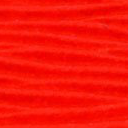

In [236]:
tensor_to_image_transforms(red_img_t)

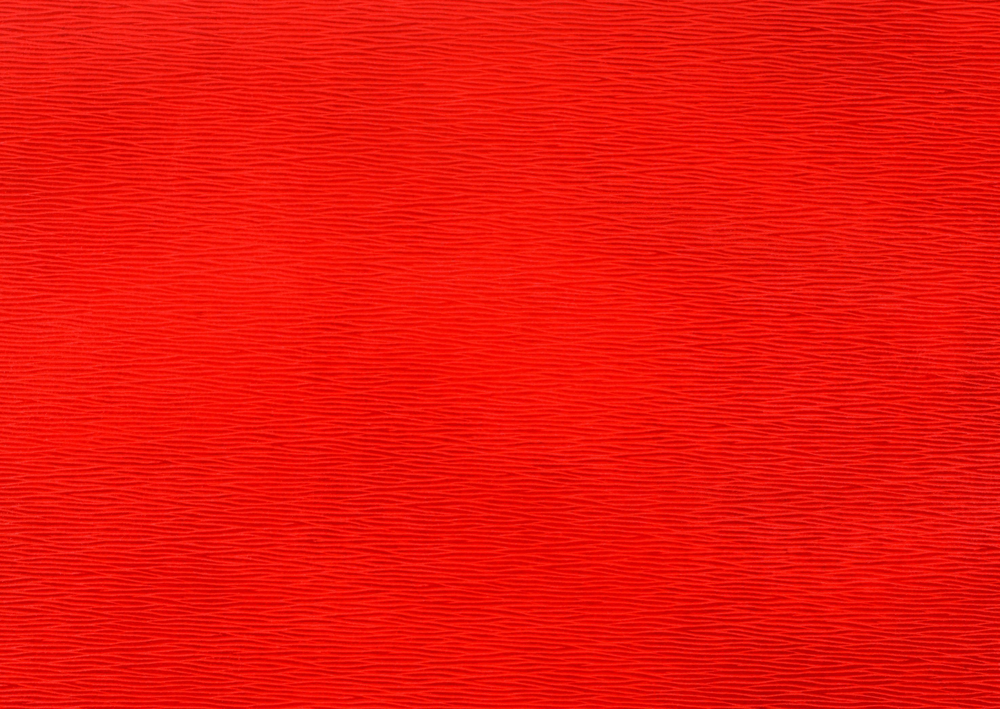

In [238]:
Image.open("red.jpg")

In [ ]:
t_c = 